In [ ]:
#plotly libraries
import plotly.express as px
import plotly.colors as pc
import plotly.graph_objects as go
import plotly.io as pio
import os
import pandas as pd
import numpy as np


#default renderer (svg means very small file size, visibility on github, high quality, but requires sometimes setting height and width)
#pio.renderers.default = "jupyterlab"
pio.renderers.default = "svg"
colors = ["#363b3d", "#727b76", "#31a240", "#f93939", "#f79118", "#de7b06", "#9b308f", "#dc759b"]
#additional defaults
px.defaults.color_discrete_sequence = ["rgb(100,100,100)"] + pc.qualitative.D3
px.defaults.width=1000
px.defaults.height=500


#try setting this as default for histograms
#fig.update_traces(marker_line_width=0.2)

#pio.templates["simple_white"].layout.template.data.Histogram["marker_line_width"] = 0.2


#set default template as "simple_white" (no background, no grid lines)
pio.templates["simple_white"].layout["yaxis"]["showgrid"] = True
pio.templates["simple_white"].layout["xaxis"]["showgrid"] = True
pio.templates.default = "simple_white"

# Evaluate RC files


In [9]:
def to_int(bytestring):
    return int.from_bytes(bytestring, byteorder="little")

def bytes_to_seq(bytestring):
    sequence = []
    nts = ["A", "C", "G", "T", "N"]
    for byte in bytestring:
        high, low = byte >> 4, byte & 0x0F
        sequence.append(nts[high])
        sequence.append(nts[low])
    return sequence

def read_rc(filepath):
    with open(filepath, "rb") as infile:
        
        len_transcript_id = to_int(infile.read(4))
        #print("len_transcript_id", len_transcript_id, sep=":")
        transcript_id = infile.read(len_transcript_id).decode("utf8")
        #print("transcript_id",transcript_id)
        len_seq = to_int(infile.read(4))
        #print("len_seq",len_seq)
        seq =  bytes_to_seq(infile.read(int((len_seq+1)/2)))
        
        counts = [to_int(infile.read(4)) for i in range(len_seq)]
        #print("counts",counts, len(counts))
        
        coverage = [to_int(infile.read(4)) for i in range(len_seq)]
        #print("coverage",coverage, len(coverage))
        
        #print("rest of file", rest_of_file)
        num_reads_to_transcript = to_int(infile.read(4))
        #print("num_reads_to_transcript",num_reads_to_transcript)
        num_reads_experiment = to_int(infile.read(4))
        #print("num_reads_experiment",num_reads_experiment)
        rest_of_file = infile.read()
        
        df = pd.DataFrame(np.array([seq, counts, coverage, np.arange(1,len(seq)+1)]).T, columns = ["nt", "mutations", "coverage", "position"])
        df["mutations"] = df["mutations"].astype(int)
        df["coverage"] = df["coverage"].astype(int)
        df["nt"] = df["nt"].astype("category")
        df["mut_rate"] = df["mutations"]/df["coverage"]
    return df

def analyse_rc(df, max_y = 0.1):
    df["mutations"] = df["mutations"].astype(int)
    df["coverage"] = df["coverage"].astype(int)
    df["nt"] = df["nt"].astype("category")
    df["mut_rate"] = df["mutations"]/df["coverage"]
    fig = px.box(df, x="nt", y="mut_rate", category_orders={"nt":["A", "C", "G", "T"]})
    fig.update_yaxes(range=[0,max_y])
    fig.show()
    fig = px.box(df, x="nt", y="coverage", category_orders={"nt":["A", "C", "G", "T"]})
    fig.show()
    return fig

In [42]:
settings = ["", "-nd -ni "]

In [43]:
rc_df = pd.DataFrame()
barcodes = [f"barcode{str(i).zfill(2)}" for i in range(1,7)]
for rf_count_additional_config in settings:
    title = "ROCAUC vs coverage, reads filtered by mean PHRED >10<br>rfcount:" + rf_count_additional_config
    filename = "read_mean_q10" + rf_count_additional_config.replace("-", "_").replace(" ", "")
    subsample_size=subsample_sizes[-1]
    
    for barcode in barcodes:
        for i in range(subsample_num):
            temp_df = read_rc(f'grid_search/rf_count/{filename}/{barcode}/{subsample_size}/{i}_MD_sorted.rc')
            temp_df["repeat"] = i
            temp_df["barcode"] = barcode
            temp_df["config"] = rf_count_additional_config
            if "-q" in rf_count_additional_config:
                temp_df["position_qscore"] = rf_count_additional_config.split("-q ")[1].split(" ")[0]
            else: 
                temp_df["position_qscore"] = 20
            if "-eq" in rf_count_additional_config:
                temp_df["read_median_qscore"] = rf_count_additional_config.split("-eq ")[1].split(" ")[0]
            else: 
                temp_df["read_median_qscore"] = 20
            if "-nd -ni" in rf_count_additional_config:
                temp_df["ignore_indels"] = True
            else:
                temp_df["ignore_indels"] = False
            rc_df = rc_df.append(temp_df)
            
rc_df["coverage"] = rc_df["coverage"].astype(int)
rc_df["read_median_qscore"] = rc_df["read_median_qscore"].astype(int)
rc_df["mutations"] = rc_df["mutations"].astype(int)
rc_df["nt"] = rc_df["nt"].astype("category")
len(rc_df)
rc_df["mut_rate"] = rc_df["mutations"]/rc_df["coverage"]
rc_df["position"] = rc_df["position"].astype(int)


barcode01_df = rc_df[rc_df["barcode"] == "barcode01"]
reactivity_per_config = {}

for rf_count_additional_config in settings:
    title = "ROCAUC vs coverage, reads filtered by mean PHRED >10<br>rfcount:" + rf_count_additional_config
    filename = "read_mean_q10" + rf_count_additional_config.replace("-", "_").replace(" ", "")
    sub_df = barcode01_df[barcode01_df["config"] == rf_count_additional_config]
    reactivity_per_config[rf_count_additional_config] = sub_df.groupby("position")["mut_rate"].mean().to_dict()
    
    
def divide_no_zero(x1, x2):
    try:
        return x1/x2
    except:
        return 10000
    
rc_df["signal_to_noise"] = rc_df.apply(lambda x: divide_no_zero(x.mut_rate,reactivity_per_config[x.config][x.position]), axis=1)

rc_df["read_median_qscore"] = rc_df["read_median_qscore"].astype(int)

def log_no_zero(value):
    try:
        return np.log10(value)
    except:
        return -4
    
rc_df["log_signal_to_noise"] = rc_df["signal_to_noise"].apply(lambda x : log_no_zero(x))


rc_df["mut_rate_percent"] = rc_df["mut_rate"]*100

rc_df["DMS_conc"] = rc_df["barcode"].apply(lambda x: barcode_to_DMS[x])
#rc_df.to_pickle("rf_norm_subsampling/rc_file_df_read_mean_q10.pickle", compression="gzip")

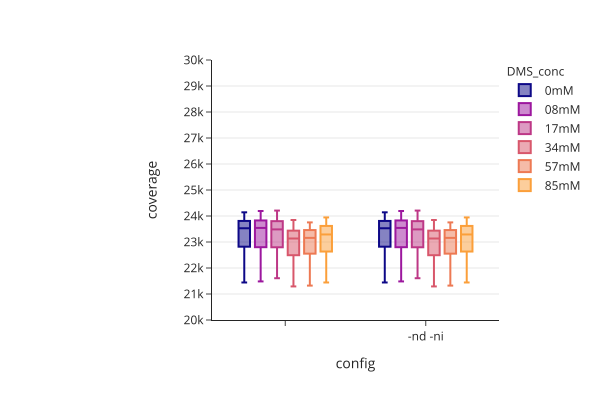

In [95]:
os.makedirs(f"{figure_dir}/setting_vs_coverage", exist_ok=True)
width=600
height=400
fig = px.box(rc_df, x="config", y="coverage", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)
fig.update_yaxes(range=[20000,30000], dtick=1000)
fig.write_image(f"{figure_dir}/setting_vs_coverage/{prefix}.svg", width=width, height=height)
fig.show(renderer="svg", width=width,height=height)

In [376]:
rc_df.columns

Index(['nt', 'mutations', 'coverage', 'position', 'mut_rate', 'repeat',
       'barcode', 'config', 'position_qscore', 'read_median_qscore',
       'ignore_indels', 'signal_to_noise', 'log_signal_to_noise',
       'mut_rate_percent', 'DMS_conc'],
      dtype='object')

In [18]:
rc_df["mut_rate_percent"] = rc_df["mut_rate"]*100

In [19]:
rc_df.loc[rc_df["DMS_conc"] == "0mM", "DMS_conc"] = "00mM"

In [445]:
prefix = "default_vs_ndni"

mean_stdev = rc_df.groupby(["DMS_conc", "config", "nt", "position_qscore", "read_median_qscore", "ignore_indels"]).agg({"mut_rate_percent":  ["mean", "std", "median"]}).dropna().reset_index()
mean_stdev.columns=["DMS_conc", "config", "nt", "position_qscore", "read_median_qscore", "ignore_indels", "mean_mut_rate", "std_mut_rate", "median_mut_rate"]
mean_stdev.to_excel(f"data_to_export/mutrate_per_nt_{prefix}.xlsx", engine="openpyxl")

In [446]:
prefix = "default_vs_ndni"

mean_stdev = rc_df.groupby(["DMS_conc", "config", "position_qscore", "read_median_qscore", "ignore_indels"]).agg({"mut_rate_percent":  ["mean", "std", "median"]}).dropna().reset_index()
mean_stdev.columns=["DMS_conc", "config", "position_qscore", "read_median_qscore", "ignore_indels", "mean_mut_rate", "std_mut_rate", "median_mut_rate"]
mean_stdev.to_excel(f"data_to_export/mutrate{prefix}.xlsx", engine="openpyxl")

In [416]:
prefix = "default_vs_ndni"

mean_stdev = rc_df[rc_df["signal_to_noise"] != 10000].groupby(["DMS_conc", "config", "nt", "position_qscore", "read_median_qscore", "ignore_indels"]).agg({"signal_to_noise":  ["mean", "std", "median"]}).dropna().reset_index()
mean_stdev.columns=["DMS_conc", "config", "nt", "position_qscore", "read_median_qscore", "ignore_indels", "mean_sig_to_noise", "std_sig_to_noise", "median_sig_to_noise"]
mean_stdev.to_excel(f"data_to_export/signal_noise_{prefix}.xlsx", engine="openpyxl")

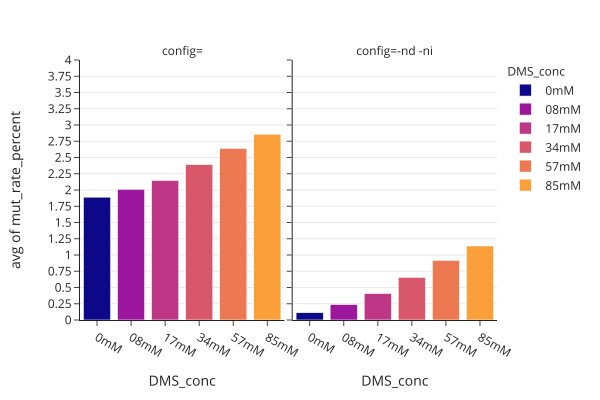

In [44]:
prefix = "default_vs_ndni"
os.makedirs(f"{figure_dir}/DMS_conc_vs_mut_rate", exist_ok=True)
width=600
height=400
fig = px.histogram(rc_df, x="DMS_conc", y="mut_rate_percent", facet_col="config", histfunc="avg", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)
#fig.update_traces(marker_size=2)
fig.update_yaxes(range=[0,4], dtick=0.25)
fig.write_image(f"{figure_dir}/DMS_conc_vs_mut_rate/{prefix}_overall_mut_rate_bar.svg", width=width, height=height)
fig.show(renderer="svg", width=width,height=height)

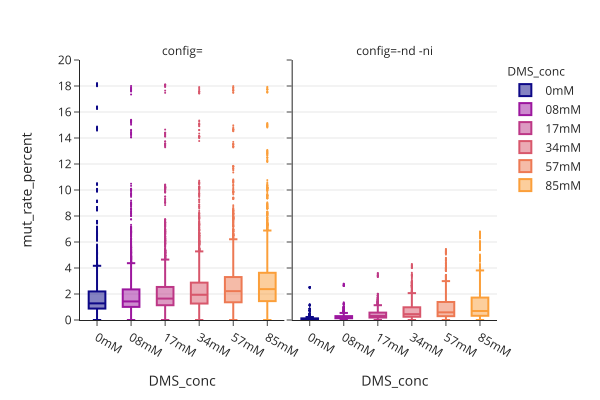

In [109]:
os.makedirs(f"{figure_dir}/DMS_conc_vs_mut_rate", exist_ok=True)

fig = px.box(rc_df, x="DMS_conc", y="mut_rate_percent", facet_col="config", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)
fig.update_traces(marker_size=2)
fig.update_yaxes(range=[0,20], dtick=2)
fig.write_image(f"{figure_dir}/DMS_conc_vs_mut_rate/{prefix}_overall_mut_rate.svg", width=width, height=height)
fig.show(renderer="svg", width=width,height=height)

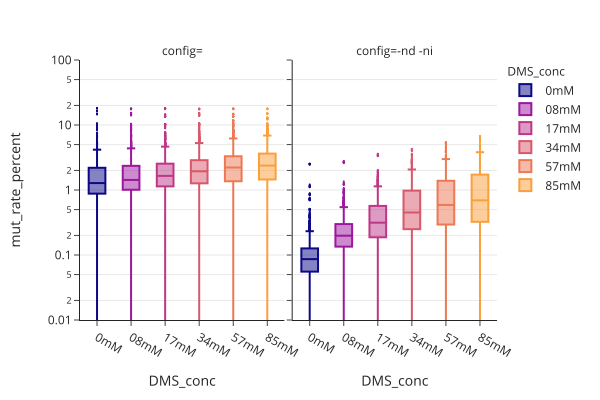

In [110]:
os.makedirs(f"{figure_dir}/DMS_conc_vs_mut_rate", exist_ok=True)

fig = px.box(rc_df, x="DMS_conc", y="mut_rate_percent", facet_col="config", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)
fig.update_traces(marker_size=2)
fig.update_yaxes(range=[-2,2],type="log")
fig.write_image(f"{figure_dir}/DMS_conc_vs_mut_rate/{prefix}_overall_mut_rate_log.svg", width=width, height=height)
fig.show(renderer="svg", width=width,height=height)

In [122]:
width=800
height=800
nt_colorscale = ["rgb(194,32,5)", "rgb(6,42,193)", "rgb(188,175,12)", "rgb(0,187,13)"]

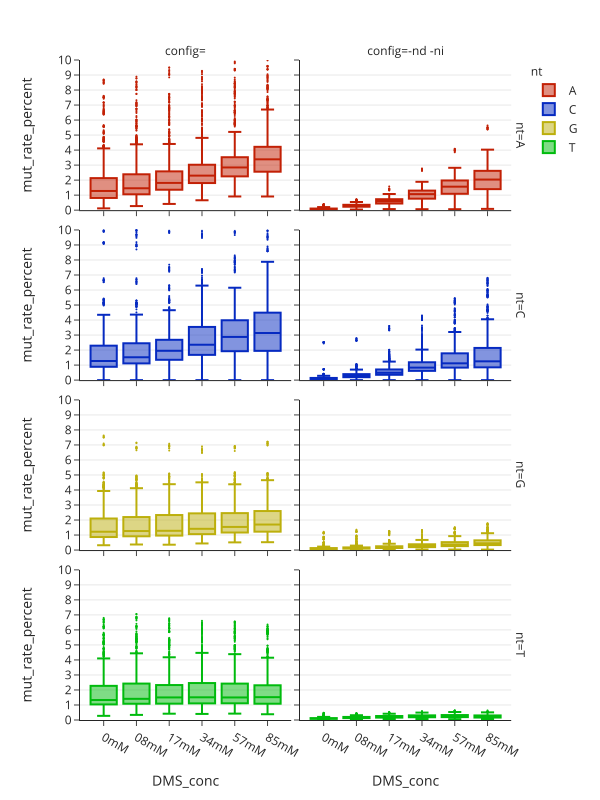

In [178]:
fig = px.box(rc_df, x="DMS_conc", y="mut_rate_percent", facet_col="config", facet_row ="nt", color="nt", color_discrete_sequence=nt_colorscale, category_orders=order)
fig.update_traces(marker_size=2, width=0.8)
fig.update_yaxes(range=[0,10], dtick=1)
fig.write_image(f"{figure_dir}/DMS_conc_vs_mut_rate/{prefix}_mut_rate_per_nt.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

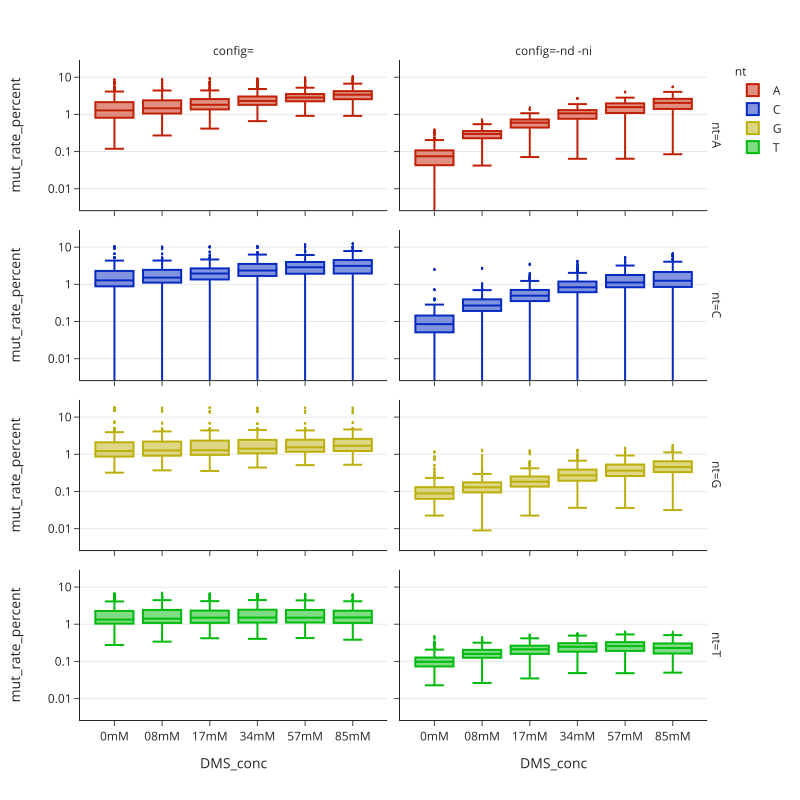

In [128]:
fig = px.box(rc_df, x="DMS_conc", y="mut_rate_percent", facet_col="config", facet_row ="nt", color="nt", color_discrete_sequence=nt_colorscale, category_orders=order)
fig.update_traces(marker_size=2, width=0.8)
fig.update_yaxes(type="log")
fig.write_image(f"{figure_dir}/DMS_conc_vs_mut_rate/{prefix}_mut_rate_per_nt_log.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

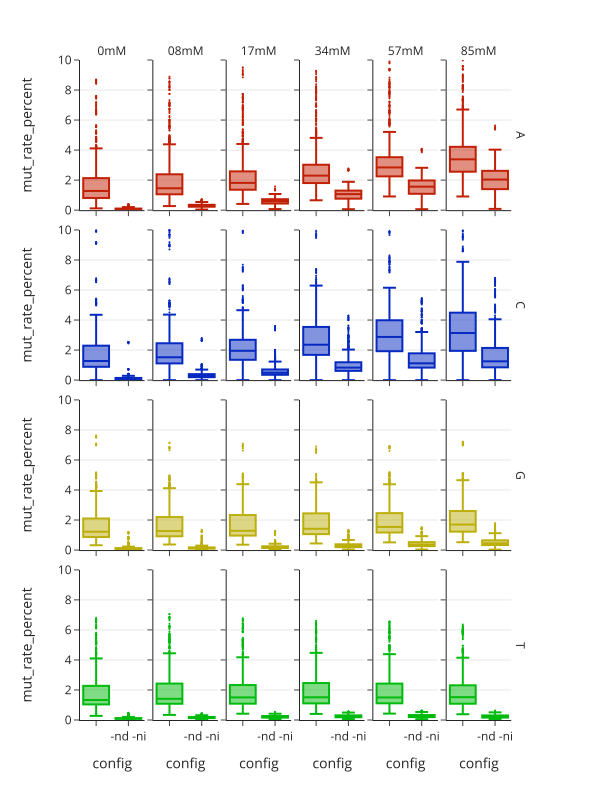

In [179]:
os.makedirs(f"{figure_dir}/config_vs_mut_rate", exist_ok=True)
width=600
height=800

fig = px.box(rc_df, x="config", y="mut_rate_percent", facet_col="DMS_conc", facet_row ="nt", color="nt", color_discrete_sequence=nt_colorscale, category_orders=order)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_traces(marker_size=2, width=0.8)
fig.update_yaxes(range=[0,10], dtick=2)
fig.update_layout(showlegend=False)
fig.write_image(f"{figure_dir}/config_vs_mut_rate/{prefix}_mut_rate_per_nt.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

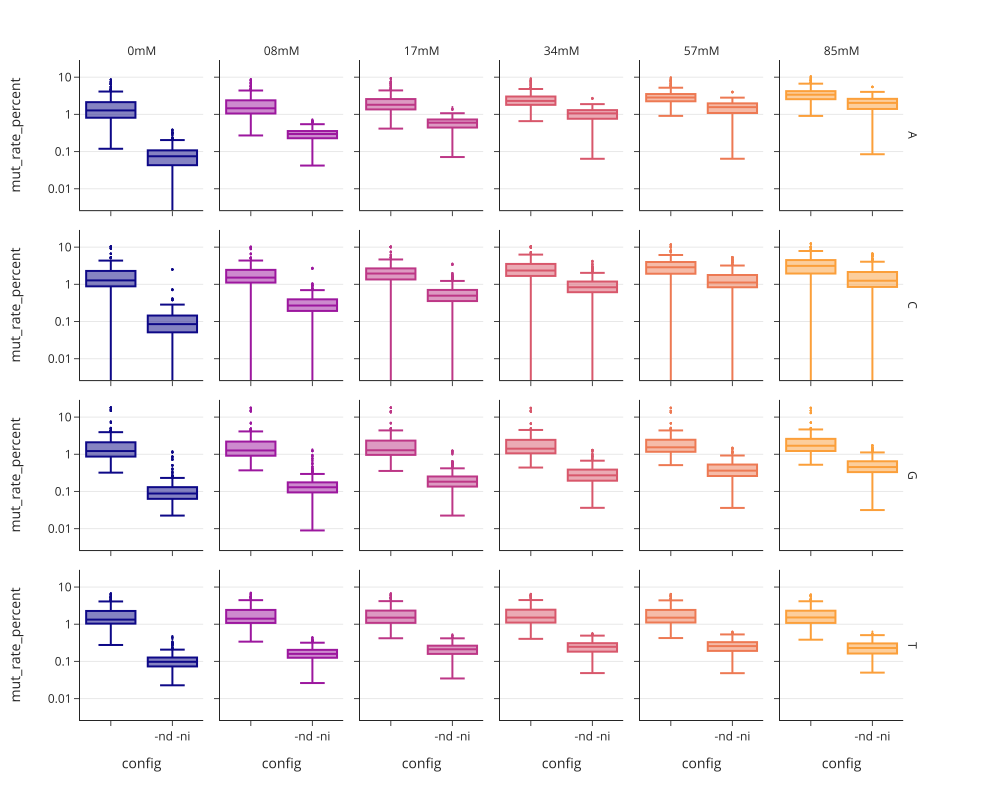

In [147]:
fig = px.box(rc_df, x="config", y="mut_rate_percent", facet_col="DMS_conc", facet_row ="nt", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)
fig.update_yaxes(type="log")
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(showlegend=False)

fig.update_traces(marker_size=2, width=0.8)
fig.write_image(f"{figure_dir}/config_vs_mut_rate/{prefix}_mut_rate_per_nt_log.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

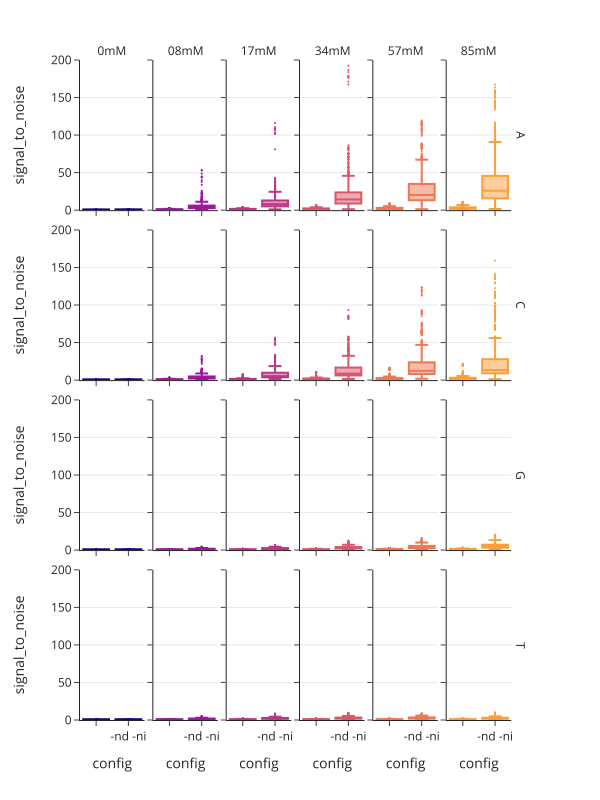

In [160]:
os.makedirs(f"{figure_dir}/config_vs_signal_to_noise", exist_ok=True)
width=600
height=800
fig = px.box(rc_df, x="config", y="signal_to_noise", facet_col="DMS_conc", facet_row ="nt", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(showlegend=False)

fig.update_traces(marker_size=2, width=0.8)
fig.update_yaxes(range=[0,200])
fig.write_image(f"{figure_dir}/config_vs_signal_to_noise/{prefix}_signal_to_noise.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

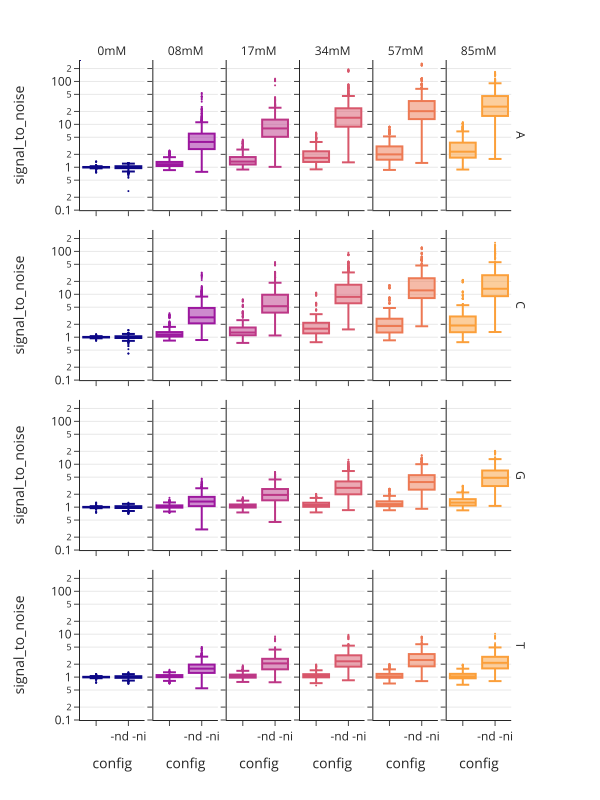

In [164]:
os.makedirs(f"{figure_dir}/config_vs_signal_to_noise", exist_ok=True)
width=600
height=800
fig = px.box(rc_df, x="config", y="signal_to_noise", facet_col="DMS_conc", facet_row ="nt", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(showlegend=False)

fig.update_traces(marker_size=2, width=0.8)
fig.update_yaxes(type="log", range=[-1,2.5])
fig.write_image(f"{figure_dir}/config_vs_signal_to_noise/{prefix}_signal_to_noise_log.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

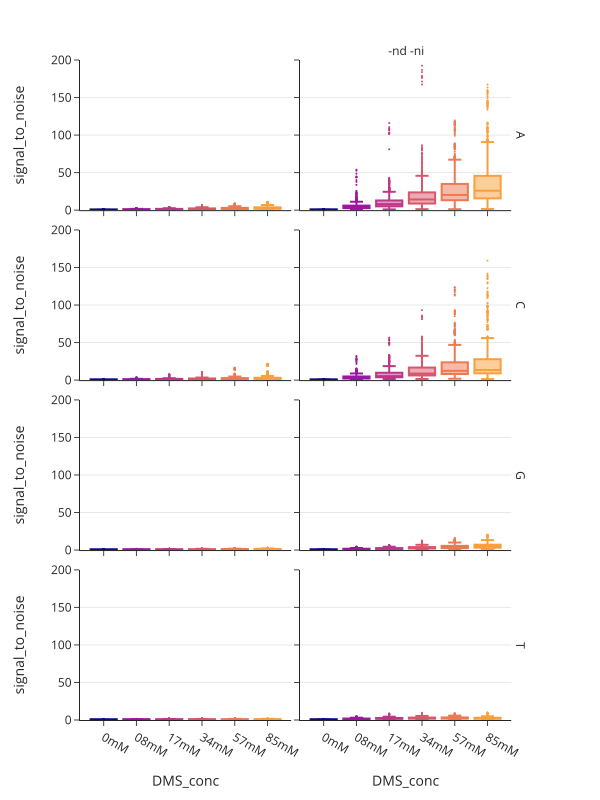

In [165]:
os.makedirs(f"{figure_dir}/config_vs_signal_to_noise", exist_ok=True)
width=600
height=800
fig = px.box(rc_df, x="DMS_conc", y="signal_to_noise", facet_col="config", facet_row ="nt", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(showlegend=False)

fig.update_traces(marker_size=2, width=0.8)
fig.update_yaxes(range=[0,200])
fig.write_image(f"{figure_dir}/config_vs_signal_to_noise/{prefix}_signal_to_noise_vs_DMS.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

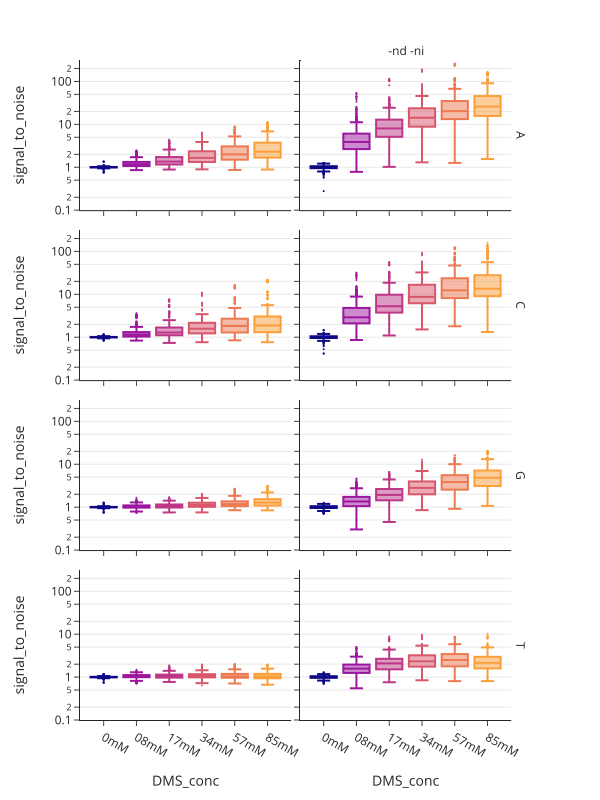

In [168]:
os.makedirs(f"{figure_dir}/config_vs_signal_to_noise", exist_ok=True)
width=600
height=800
fig = px.box(rc_df, x="DMS_conc", y="signal_to_noise", facet_col="config", facet_row ="nt", color="DMS_conc", color_discrete_sequence=colorscale, category_orders=order)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(showlegend=False)

fig.update_traces(marker_size=2, width=0.8)
fig.update_yaxes(type="log", range=[-1,2.5])
fig.write_image(f"{figure_dir}/config_vs_signal_to_noise/{prefix}_signal_to_noise_vs_DMS_log.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

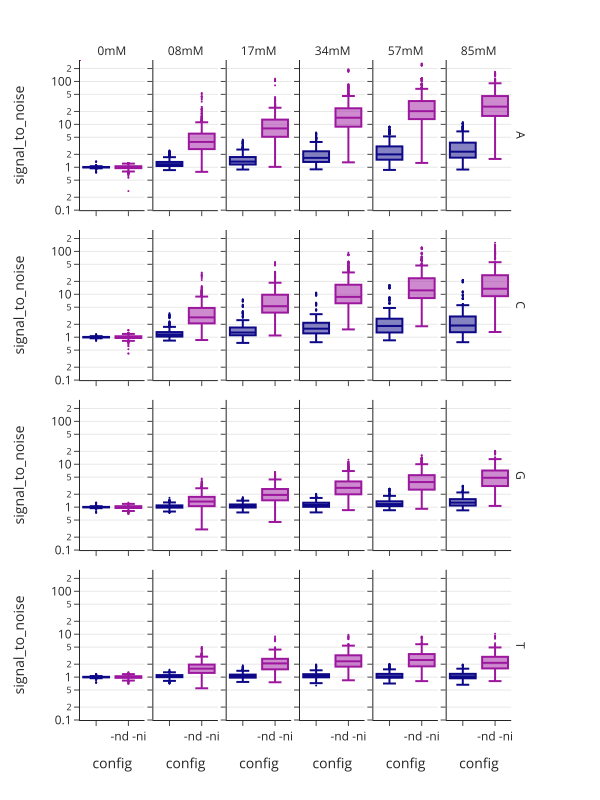

In [176]:
os.makedirs(f"{figure_dir}/config_vs_signal_to_noise", exist_ok=True)
width=600
height=800
fig = px.box(rc_df, x="config", y="signal_to_noise",facet_row ="nt", facet_col="DMS_conc", color="config", boxmode="group", color_discrete_sequence=colorscale, category_orders=order)

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(showlegend=False, boxmode="group")

fig.update_traces(marker_size=2, width=0.8)
fig.update_yaxes(type="log", range=[-1,2.5])
fig.write_image(f"{figure_dir}/config_vs_signal_to_noise/{prefix}_signal_to_noise_vs_DMS_config_in_one_log.svg", width=width, height=height)
fig.show(renderer="svg", width=width, height=height)

# Evaluate MM files (number of mutations per read)

In [ ]:
import pysam
import pandas as pd
import numpy as np

# MM file statistics

In [232]:
import numpy as np
import pandas as pd
from collections import Counter


def read_mmi(file):
    transcripts = {}
    with open(file, "rb") as infile:
        bin_len_transcript_id = infile.read(2)
        len_transcript_id = int.from_bytes(bin_len_transcript_id, byteorder="little")
        print(bin_len_transcript_id)
        transcript_id = infile.read(len_transcript_id-1).decode()
        print(len_transcript_id)
        infile.read(1)
        offset = int.from_bytes(infile.read(4), byteorder="little")
        transcripts[transcript_id] = offset
    return transcripts


def bseq_to_seq(bseq):
    nt_dict = ["A", "C", "G", "T", "N"]
    sequence = []
    for b in bseq:
        lb = (b >> 4) & 0xf
        hb = (b) & 0xf
        sequence.append(nt_dict[lb])
        sequence.append(nt_dict[hb])
    return sequence

def read_mm_add_empty(file,read_lengths = [], df_only = False):
    barcode_isoform = file.split("/")[-1].split("_MD")[0]
    #read_count = read_count_dict[barcode_isoform]
    print(file)
    #print("read_count", read_count)
    
    data = []
    with open(file, "rb") as infile:
        len_transcript_id = int.from_bytes(infile.read(2), byteorder="little")
        transcript_id = infile.read(len_transcript_id-1).decode()

        infile.read(1)
        b_len_seq = infile.read(4)

        len_seq = int.from_bytes(b_len_seq, byteorder="little")

        bseq = infile.read(int((len_seq+1)/2))
        seq = bseq_to_seq(bseq)

        b_read_count = int.from_bytes(infile.read(4), byteorder="little")
        print("byte read count", b_read_count)

        mod_matrix = np.zeros((b_read_count, len_seq), dtype=bool)
        coverage = np.zeros(len_seq, dtype=int)
        
        for count in range(b_read_count):
            start = int.from_bytes(infile.read(4), byteorder="little")
            end = int.from_bytes(infile.read(4), byteorder="little")
            mut_count = int.from_bytes(infile.read(4), byteorder="little")
            indices = []
            for i in range(mut_count):
                indices.append(int.from_bytes(infile.read(4), byteorder="little"))
            data.append(
            {"read_id" : count,
            "start" : start,
             "end" : end,
             "mut_count" : mut_count,
             "indices" : indices, 
             "read_count" : b_read_count,
             "path" : file,
            })
            mod_matrix[count, indices] = True
            coverage[start:end] += 1
    
    
    

    tmp_df = pd.DataFrame(data)
    tmp_df["mapped_bases"]=tmp_df["end"]-tmp_df["start"]
    known_read_lengths = tmp_df["mapped_bases"].values
    
    print("read in", len(tmp_df), "reads")
    if len(read_lengths) > len(tmp_df):
        print("adding reads")
        print("total number of reads:", len(read_lengths))
        ca = Counter(known_read_lengths)
        cb = Counter(read_lengths)

        missing_read_lengths = sorted((cb - ca).elements())
        
        print(len(missing_read_lengths), "reads were missing")
    
        
        for read_length in missing_read_lengths:
            data.append(
            {"read_id" : len(data),
            "start" : 0,
            "end" : read_length,
            "mut_count" : 0,
            "indices" : [],
            "read_count" : np.nan,
            "path" : ""})
            
    
    df = pd.DataFrame(data)
    df["mapped_bases"]=df["end"]-df["start"] +1
    
    filename = file.split("/")[-1]
    df["file"]= filename
    if df_only:
        return df, known_read_lengths, read_lengths
    else:
        return df, mod_matrix, coverage, seq
    
    
    
def read_mm(file,read_lengths = [], df_only = False):
    barcode_isoform = file.split("/")[-1].split("_MD")[0]
    #read_count = read_count_dict[barcode_isoform]
    print(file)
    #print("read_count", read_count)
    
    data = []
    with open(file, "rb") as infile:
        len_transcript_id = int.from_bytes(infile.read(2), byteorder="little")
        transcript_id = infile.read(len_transcript_id-1).decode()

        infile.read(1)
        b_len_seq = infile.read(4)

        len_seq = int.from_bytes(b_len_seq, byteorder="little")

        bseq = infile.read(int((len_seq+1)/2))
        seq = bseq_to_seq(bseq)

        b_read_count = int.from_bytes(infile.read(4), byteorder="little")
        print("byte read count", b_read_count)

        mod_matrix = np.zeros((b_read_count, len_seq), dtype=bool)
        coverage = np.zeros(len_seq, dtype=int)
        
        for count in range(b_read_count):
            start = int.from_bytes(infile.read(4), byteorder="little")
            end = int.from_bytes(infile.read(4), byteorder="little")
            mut_count = int.from_bytes(infile.read(4), byteorder="little")
            indices = []
            for i in range(mut_count):
                indices.append(int.from_bytes(infile.read(4), byteorder="little"))
            data.append(
            {"read_id" : count,
            "start" : start,
             "end" : end,
             "mut_count" : mut_count,
             "indices" : indices, 
             "read_count" : b_read_count,
             "path" : file,
            })
            mod_matrix[count, indices] = True
            coverage[start:end] += 1
    

    df = pd.DataFrame(data)
    df["mapped_bases"]=df["end"]-df["start"] +1
    
    filename = file.split("/")[-1]
    df["file"]= filename
    if df_only:
        return df
    else:
        return df, mod_matrix, coverage, seq

In [98]:
DMS_concs = ["0mM", "8mM", "17mM", "34mM", "57mM", "85mM"]

In [227]:
# As the MM files do not contain information about the number of non-modified reads, they're infered from bam files for the mut_count and mut_rate statistics

#https://www.seqanswers.com/forum/bioinformatics/bioinformatics-aa/45791-looking-for-easy-way-to-find-right-most-end-of-alignment-in-bam#post262649 
add_YS_tag = f"python3 python_functions/add_bam_rightmost.py"

from slurmpy import Slurm
num_threads = 1
def get_total_num_reads_in_bam(bam_file, outfile):
    job_name = "samtools_view"
    
    s = Slurm(job_name, {"partition" : "cpu", "mem" : "10G", "cpus-per-task" : num_threads, "time" : "30",  "mail-user" : "patrick.bohn@helmholtz-hiri.de"})
 
    command = f"samtools view -c -F 260 {bam_file} > {outfile}"
    return s.run(command)

def get_read_lengths_in_bam(bam_file, outfile):
    job_name = "readlengths"
    commands = []
    s = Slurm(job_name, {"partition" : "cpu", "mem" : "10G", "cpus-per-task" : num_threads, "time" : "30",  "mail-user" : "patrick.bohn@helmholtz-hiri.de"})
    
    commands.append(f"{add_YS_tag} {bam_file} > {bam_file.split('.bam')[0]}_YS.bam")
    commands.append(f"samtools view -F 4 {bam_file.split('.bam')[0]}_YS.bam | cut -f 4 > {outfile}.read_starts")
    commands.append(f"samtools view -F 4 {bam_file.split('.bam')[0]}_YS.bam | head -n 100 > {outfile}_YS.sam")
    commands.append(f"samtools view -F 4 {bam_file.split('.bam')[0]}_YS.bam | grep -oP '(?<=YS:i:)[0-9]+' > {outfile}.read_ends")
    return s.run("\n".join(commands))

In [ ]:

tmp_data = []
for rep in ["Rep1", "Rep2"]:
    for DMS_conc in DMS_concs:
        for location in ["cell", "virion"]:
            for treatment in ["native", "deprot"]:
                nanopore_sample = f"{rep}_RT1_{DMS_conc}_{location}_{treatment}"
                bam_file = f"/vol/projects/pbohn/AnSo_DMS_MaP/{rep}_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/{nanopore_sample}_RT1_unspliced1_MD_sorted_YS.bam"
                outfile = f"/vol/projects/pbohn/AnSo_DMS_MaP/{rep}_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/{nanopore_sample}_RT1_unspliced1_MD_sorted_read_lengths.csv"
                get_read_lengths_in_bam(bam_file, outfile)

In [183]:

tmp_data = []
for rep in ["Rep1"]:
    for DMS_conc in [DMS_concs[0]]:
        for location in ["cell"]:
            for treatment in ["native"]:
                nanopore_sample = f"{rep}_RT1_{DMS_conc}_{location}_{treatment}"
                mm_file = f"/vol/projects/pbohn/AnSo_DMS_MaP/{rep}_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/{nanopore_sample}_RT1_unspliced1_MD_sorted.mm"
                outfile = f"/vol/projects/pbohn/AnSo_DMS_MaP/{rep}_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/{nanopore_sample}_RT1_unspliced1_MD_sorted_read_lengths.csv"
                try:
                    read_starts = np.genfromtxt(f"{outfile}.read_starts").astype(int)
                    read_starts[read_starts < 27] = 27
                    
                    read_ends = np.genfromtxt(f"{outfile}.read_ends").astype(int)
                    read_ends[read_ends > 506] = 506
                    read_lengths = read_ends - read_starts
                    print(read_lengths)
                    tmp_df, known_read_lengths, read_lengths = read_mm_add_empty(mm_file, read_lengths, df_only = True)
                except:
                    continue

[479 479 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_0mM_cell_native_RT1_unspliced1_MD_sorted.mm
byte read count 8629
read in 8629 reads
adding reads
total number of reads: 39492
30903 reads were missing


In [185]:

tmp_data = []
for rep in ["Rep1", "Rep2"]:
    for DMS_conc in DMS_concs:
        for location in ["cell", "virion"]:
            for treatment in ["native", "deprot"]:
                nanopore_sample = f"{rep}_RT1_{DMS_conc}_{location}_{treatment}"
                mm_file = f"/vol/projects/pbohn/AnSo_DMS_MaP/{rep}_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/{nanopore_sample}_RT1_unspliced1_MD_sorted.mm"
                read_lengths_file = outfile = f"/vol/projects/pbohn/AnSo_DMS_MaP/{rep}_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/{nanopore_sample}_RT1_unspliced1_MD_sorted_read_lengths.csv"
                
                try:
                    read_starts = np.genfromtxt(f"{outfile}.read_starts").astype(int)
                    read_starts[read_starts < 27] = 27
                    
                    read_ends = np.genfromtxt(f"{outfile}.read_ends").astype(int)
                    read_ends[read_ends > 506] = 506
                    read_lengths = read_ends - read_starts
                    print(read_lengths)
                    tmp_df, known_read_lengths, read_lengths = read_mm(mm_file, read_lengths, df_only = True)
                except:
                    continue
                tmp_df["rep"] = rep
                tmp_df["DMS_conc"] = DMS_conc
                tmp_df["location"] = location
                tmp_df["treatment"] = treatment
                tmp_data.append(tmp_df)
nano_df = pd.concat(tmp_data)

[479 479 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_0mM_cell_native_RT1_unspliced1_MD_sorted.mm
byte read count 8629
read in 8629 reads
adding reads
total number of reads: 39492
30903 reads were missing
[479 442 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_0mM_cell_deprot_RT1_unspliced1_MD_sorted.mm
byte read count 11914
read in 11914 reads
adding reads
total number of reads: 56863
45016 reads were missing
[316 479 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_0mM_virion_native_RT1_unspliced1_MD_sorted.mm
byte read count 17788
read in 17788 reads
adding reads
total number of reads: 85763
68421 reads were missing
[462 479 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_0mM_virion_deprot

/tmp/ipykernel_3176852/2353272750.py:11: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep1_RT1_34mM_virion_native_RT1_unspliced1_MD_sorted_read_lengths.csv.read_starts"

/tmp/ipykernel_3176852/2353272750.py:14: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep1_RT1_34mM_virion_native_RT1_unspliced1_MD_sorted_read_lengths.csv.read_ends"

/tmp/ipykernel_3176852/2353272750.py:11: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep1_RT1_34mM_virion_deprot_RT1_unspliced1_MD_sorted_read_lengths.csv.read_starts"

/tmp/ipykernel_3176852/2353272750.py:14: UserWarning:

genfromtxt: Empty input file: "/vol/projects

[]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_34mM_virion_native_RT1_unspliced1_MD_sorted.mm
[]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_34mM_virion_deprot_RT1_unspliced1_MD_sorted.mm
[479 479 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_57mM_cell_native_RT1_unspliced1_MD_sorted.mm
byte read count 37322
read in 37322 reads
adding reads
total number of reads: 52618
16447 reads were missing
[479 479 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_57mM_cell_deprot_RT1_unspliced1_MD_sorted.mm
byte read count 73024
read in 73024 reads
adding reads
total number of reads: 99349
28832 reads were missing
[479 479 458 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_R

/tmp/ipykernel_3176852/2353272750.py:11: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep1_RT1_85mM_virion_native_RT1_unspliced1_MD_sorted_read_lengths.csv.read_starts"

/tmp/ipykernel_3176852/2353272750.py:14: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep1_RT1_85mM_virion_native_RT1_unspliced1_MD_sorted_read_lengths.csv.read_ends"

/tmp/ipykernel_3176852/2353272750.py:11: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep1_RT1_85mM_virion_deprot_RT1_unspliced1_MD_sorted_read_lengths.csv.read_starts"

/tmp/ipykernel_3176852/2353272750.py:14: UserWarning:

genfromtxt: Empty input file: "/vol/projects

[]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_85mM_virion_native_RT1_unspliced1_MD_sorted.mm
[]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep1_RT1_85mM_virion_deprot_RT1_unspliced1_MD_sorted.mm
[479 479 479 ... -15 -15 -16]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep2_RT1_0mM_cell_native_RT1_unspliced1_MD_sorted.mm
byte read count 25679
read in 25679 reads
adding reads
total number of reads: 110535
85088 reads were missing
[479 479 476 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep2_RT1_0mM_cell_deprot_RT1_unspliced1_MD_sorted.mm
byte read count 19988
read in 19988 reads
adding reads
total number of reads: 92131
72891 reads were missing
[479 446 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep2_RT

/tmp/ipykernel_3176852/2353272750.py:11: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep2_RT1_34mM_virion_native_RT1_unspliced1_MD_sorted_read_lengths.csv.read_starts"

/tmp/ipykernel_3176852/2353272750.py:14: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep2_RT1_34mM_virion_native_RT1_unspliced1_MD_sorted_read_lengths.csv.read_ends"

/tmp/ipykernel_3176852/2353272750.py:11: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep2_RT1_34mM_virion_deprot_RT1_unspliced1_MD_sorted_read_lengths.csv.read_starts"

/tmp/ipykernel_3176852/2353272750.py:14: UserWarning:

genfromtxt: Empty input file: "/vol/projects

[479 479 310 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep2_RT1_57mM_cell_native_RT1_unspliced1_MD_sorted.mm
byte read count 48151
read in 48151 reads
adding reads
total number of reads: 71774
24792 reads were missing
[479 479 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep2_RT1_57mM_cell_deprot_RT1_unspliced1_MD_sorted.mm
byte read count 79423
read in 79423 reads
adding reads
total number of reads: 116935
39474 reads were missing
[479 479 183 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep2_RT1_57mM_virion_native_RT1_unspliced1_MD_sorted.mm
byte read count 27840
read in 27840 reads
adding reads
total number of reads: 41021
14191 reads were missing
[479 479 479 ... -15 -15 -15]
/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/rf_count_allow_single_bc/RT1_unspliced1/Rep2_RT1_57mM_virion

/tmp/ipykernel_3176852/2353272750.py:11: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep2_RT1_85mM_virion_native_RT1_unspliced1_MD_sorted_read_lengths.csv.read_starts"

/tmp/ipykernel_3176852/2353272750.py:14: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep2_RT1_85mM_virion_native_RT1_unspliced1_MD_sorted_read_lengths.csv.read_ends"

/tmp/ipykernel_3176852/2353272750.py:11: UserWarning:

genfromtxt: Empty input file: "/vol/projects/pbohn/AnSo_DMS_MaP/Rep2_combined_runs/isoquant_out_allow_single_bc/sorted_fastq/alignments_by_isoform/RT1_unspliced1/Rep2_RT1_85mM_virion_deprot_RT1_unspliced1_MD_sorted_read_lengths.csv.read_starts"

/tmp/ipykernel_3176852/2353272750.py:14: UserWarning:

genfromtxt: Empty input file: "/vol/projects

In [186]:
def split_nano_name(df, unique_name_column = "unique_name"):
    df["replicate"] = df[unique_name_column].apply(lambda x: x.split("_")[0])
    df["RT"] = df[unique_name_column].apply(lambda x: x.split("_")[1])
    df["DMS_conc"] = df[unique_name_column].apply(lambda x: x.split("_")[2])
    df["location"] = df[unique_name_column].apply(lambda x: x.split("_")[3])
    df["treatment"] = df[unique_name_column].apply(lambda x: x.split("_")[4])
    df["RT_and_location"] = df["RT"].astype(str) + "_" + df["location"]
    df["rep_and_DMS"] = df["replicate"] + "_" + df["DMS_conc"]
    df["DMS_conc"] = df["DMS_conc"].astype("category")
    
    return df

nano_df = split_nano_name(nano_df, unique_name_column = "file")

In [187]:
nano_df["treatment_location"] = nano_df["treatment"] + "_" + nano_df["location"]

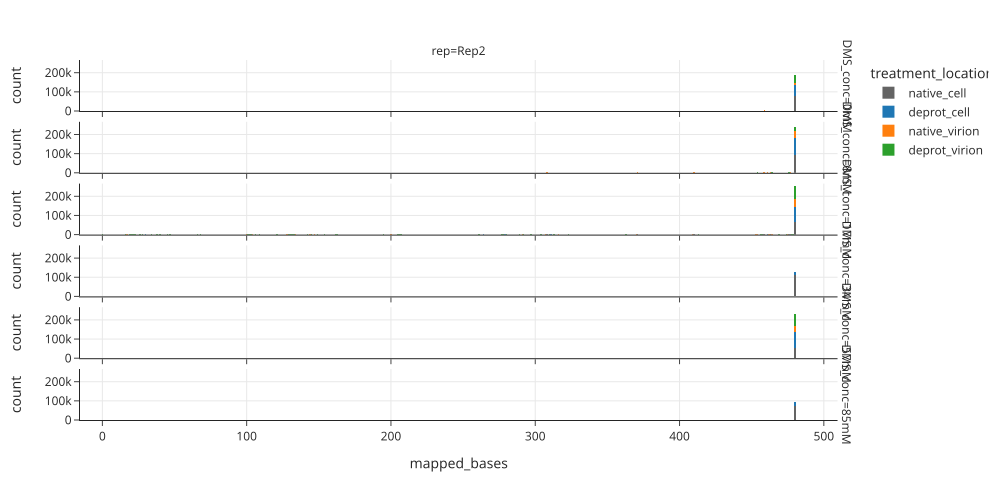

In [188]:
fig = px.histogram(nano_df[nano_df["rep"] == "Rep2"], x="mapped_bases", color="treatment_location", facet_col="rep", facet_row="DMS_conc")
fig.update_traces(marker_line_width=0)
#fig.update_yaxes(type="log")
fig.show()

In [189]:
os.makedirs("figures/illumina_comparison/mm_analysis", exist_ok=True)

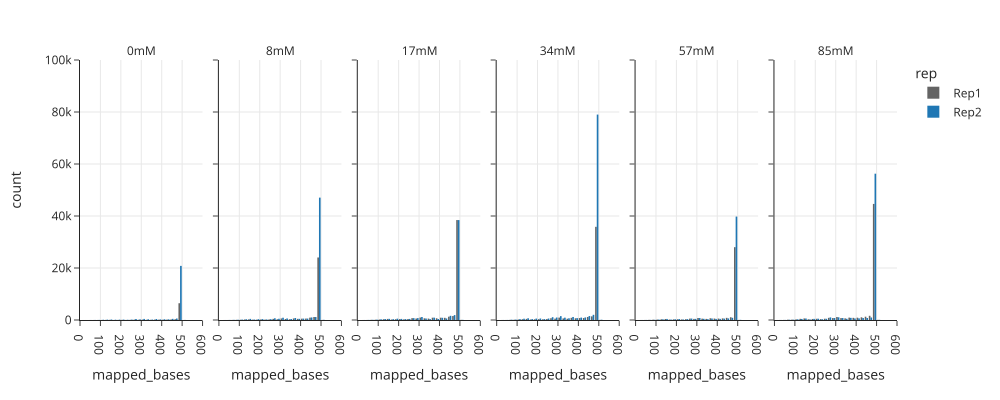

In [255]:
fig = px.histogram(nano_df[(nano_df["treatment_location"] == "native_cell") & (nano_df["mut_count"]>0)],  x="mapped_bases", color="rep", facet_col="DMS_conc")
fig.update_traces(marker_line_width=0)
#fig.update_yaxes(type="log")
fig.update_layout(barmode='group')
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=600,
        size=20
    ))
fig.update_xaxes(range=[0,600], dtick=100)
fig.update_yaxes(range=[0,100000])
fig.update_layout(width=1000, height=400)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.write_image(f"figures/illumina_comparison/mm_analysis/nanopore_mapped_bases.svg")
fig.show()

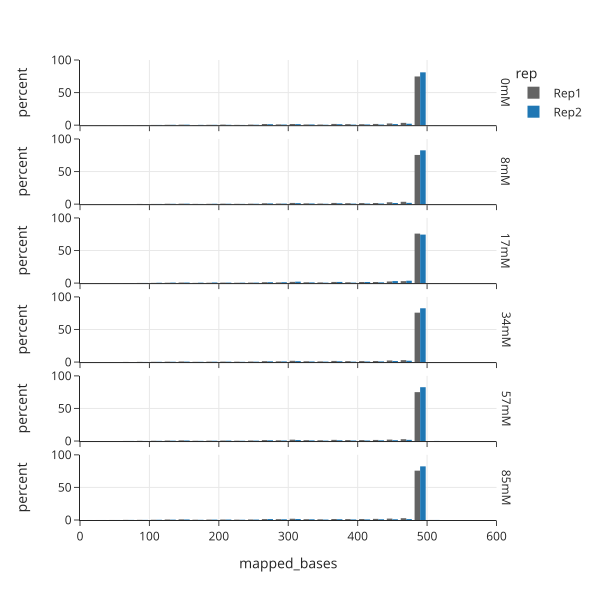

In [269]:
fig = px.histogram(nano_df[(nano_df["treatment_location"] == "native_cell") & (nano_df["mut_count"]>0)],  histnorm="percent", x="mapped_bases", color="rep", facet_row="DMS_conc")
fig.update_traces(marker_line_width=0)
#fig.update_yaxes(type="log")
fig.update_layout(barmode='group')
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=600,
        size=20
    ))
fig.update_xaxes(range=[0,600], dtick=100)
fig.update_yaxes(range=[0,100])
#fig.update_layout(width=1000, height=400)
fig.update_layout(width=600, height=600)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.write_image(f"figures/illumina_comparison/mm_analysis/nanopore_mapped_bases_norm_percent.svg")
fig.show()

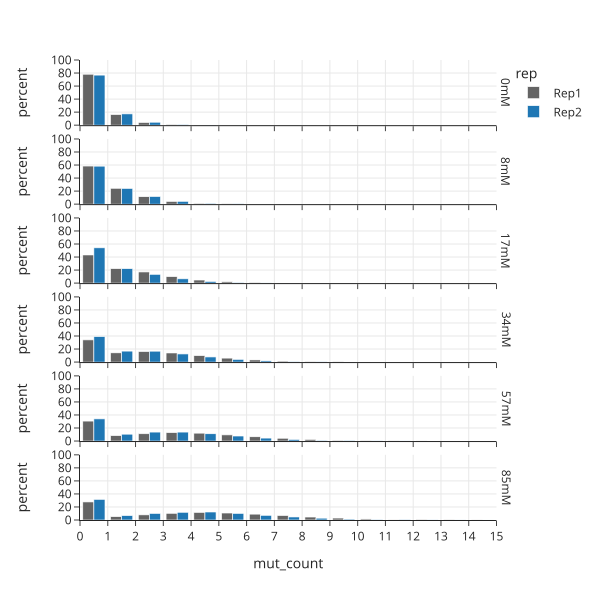

In [191]:
fig = px.histogram(nano_df[nano_df["treatment_location"] == "native_cell"],  x="mut_count", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_layout(barmode='group')
fig.update_xaxes(range=[0,15], dtick=1)
fig.update_yaxes(range=[0,100], dtick=20)
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=20,
        size=1
    ))

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width=600, height=600)
fig.write_image(f"figures/illumina_comparison/mm_analysis/nanopore_mut_count.svg")
fig.show()

In [192]:
nano_df["percent_mut_count"] = 100*nano_df["mut_count"] / nano_df["mapped_bases"]

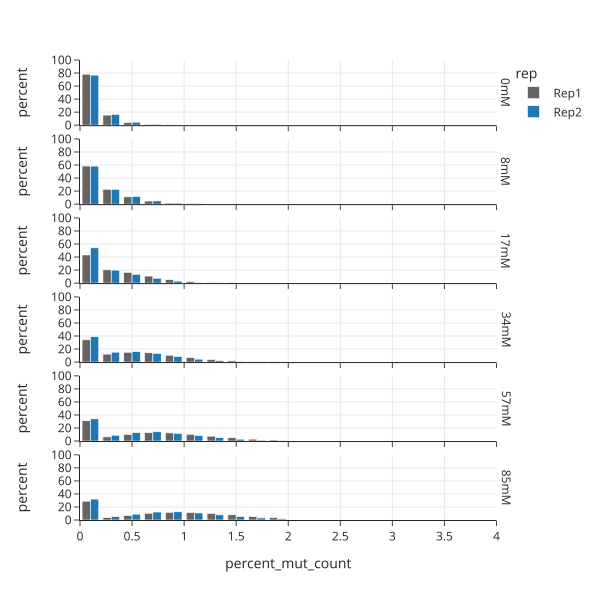

In [193]:
fig = px.histogram(nano_df[nano_df["treatment_location"] == "native_cell"], x="percent_mut_count", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_layout(barmode='group')
fig.update_xaxes(range=[0,4], dtick=0.5)
fig.update_yaxes(range=[0,100], dtick=20)
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=2,
        size=0.2
    ))
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width=600, height=600)
fig.write_image(f"figures/illumina_comparison/mm_analysis/nanopore_mut_rate.svg")
fig.show()

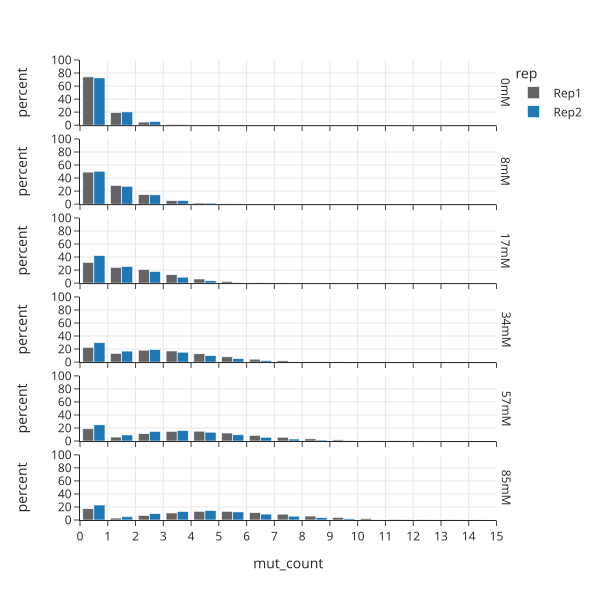

In [194]:
fig = px.histogram(nano_df[(nano_df["treatment_location"] == "native_cell") & (nano_df["mapped_bases"] > 450)],  x="mut_count", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_layout(barmode='group')
fig.update_xaxes(range=[0,15], dtick=1)
fig.update_yaxes(range=[0,100], dtick=20)
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=20,
        size=1
    ))

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width=600, height=600)
fig.write_image(f"figures/illumina_comparison/mm_analysis/nanopore_mut_count.svg")
fig.show()

In [192]:
nano_df["percent_mut_count"] = 100*nano_df["mut_count"] / nano_df["mapped_bases"]

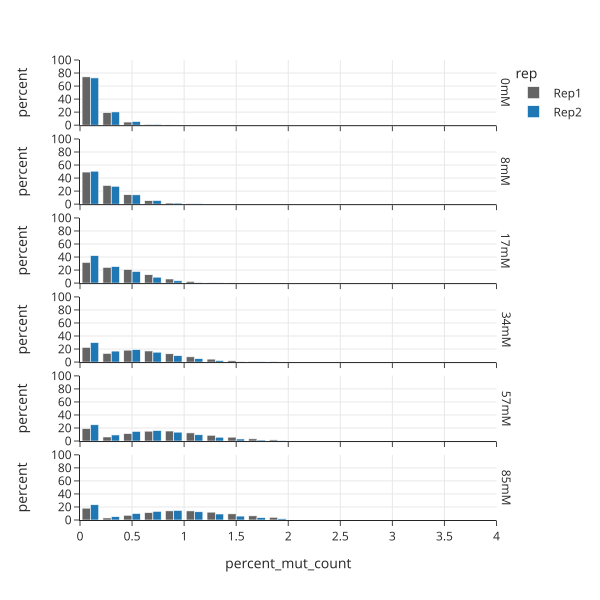

In [195]:
fig = px.histogram(nano_df[(nano_df["treatment_location"] == "native_cell")  & (nano_df["mapped_bases"] > 450)], x="percent_mut_count", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_layout(barmode='group')
fig.update_xaxes(range=[0,4], dtick=0.5)
fig.update_yaxes(range=[0,100], dtick=20)
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=2,
        size=0.2
    ))
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width=600, height=600)
fig.write_image(f"figures/illumina_comparison/mm_analysis/nanopore_mut_rate.svg")
fig.show()

# Illumina samples

In [196]:
DMS_concs = ["0mM", "8mM", "17mM", "34mM", "57mM", "85mM"]

In [54]:
from slurmpy import Slurm
num_threads = 1
def get_total_num_reads_in_bam(bam_file, outfile):
    job_name = "samtools_view"
    
    s = Slurm(job_name, {"partition" : "cpu", "mem" : "10G", "cpus-per-task" : num_threads, "time" : "30",  "mail-user" : "patrick.bohn@helmholtz-hiri.de"})
 
    command = f"samtools view -c -F 260 {bam_file} > {outfile}"
    return s.run(command)

In [55]:
tmp_data = []
for rep in ["Rep1", "Rep2"]:
    for DMS_conc in DMS_concs:
        location = "cell"
        treatment = "native"
        illumina_sample = f"{rep}_RT1_{location}_{treatment}_{DMS_conc}"
        
        bam_file = f"/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/bam/{illumina_sample}_MD_sorted.bam"
        outfile = f"/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/bam/{illumina_sample}_MD_sorted_reads.csv"
        get_total_num_reads_in_bam(bam_file, outfile)

b'Submitted batch job 798436'
b'Submitted batch job 798437'
b'Submitted batch job 798438'
b'Submitted batch job 798439'
b'Submitted batch job 798440'
b'Submitted batch job 798441'
b'Submitted batch job 798442'
b'Submitted batch job 798443'
b'Submitted batch job 798444'
b'Submitted batch job 798445'
b'Submitted batch job 798446'
b'Submitted batch job 798447'


In [228]:
tmp_data = []
for rep in ["Rep1", "Rep2"]:
    for DMS_conc in DMS_concs:
        location = "cell"
        treatment = "native"
        illumina_sample = f"{rep}_RT1_{location}_{treatment}_{DMS_conc}"
        bam_file = f"/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/bam/{illumina_sample}_MD_sorted.bam"
        outfile = f"/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/bam/{illumina_sample}_MD_sorted_reads.csv"
        get_read_lengths_in_bam(bam_file, outfile)

b'Submitted batch job 799419'
b'Submitted batch job 799420'
b'Submitted batch job 799421'
b'Submitted batch job 799422'
b'Submitted batch job 799423'
b'Submitted batch job 799424'
b'Submitted batch job 799425'
b'Submitted batch job 799426'
b'Submitted batch job 799427'
b'Submitted batch job 799428'
b'Submitted batch job 799429'
b'Submitted batch job 799430'


In [233]:

tmp_data = []
for rep in ["Rep1", "Rep2"]:
    for DMS_conc in DMS_concs:
        location = "cell"
        treatment = "native"
        illumina_sample = f"{rep}_RT1_{location}_{treatment}_{DMS_conc}"
        mm_file = f"/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/rf_count_ndni/{illumina_sample}/{illumina_sample}_MD_sorted.mm"

        outfile = f"/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/bam/{illumina_sample}_MD_sorted_reads.csv"
        
        try:
            #read_starts = np.genfromtxt(f"{outfile}.read_starts").astype(int)
            #read_starts[read_starts < 27] = 27

            #read_ends = np.genfromtxt(f"{outfile}.read_ends").astype(int)
            #read_ends[read_ends > 506] = 506
            #read_lengths = read_ends - read_starts
            #print(read_lengths)
            tmp_df = read_mm(mm_file, df_only = True)
        except:
            continue

        tmp_df["rep"] = rep
        tmp_df["DMS_conc"] = DMS_conc
        tmp_df["location"] = location
        tmp_df["treatment"] = treatment
        tmp_data.append(tmp_df)
illumina_df = pd.concat(tmp_data)

/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/rf_count_ndni/Rep1_RT1_cell_native_0mM/Rep1_RT1_cell_native_0mM_MD_sorted.mm
byte read count 616012
ERROR! Session/line number was not unique in database. History logging moved to new session 1971
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/rf_count_ndni/Rep1_RT1_cell_native_8mM/Rep1_RT1_cell_native_8mM_MD_sorted.mm
byte read count 1083484
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/rf_count_ndni/Rep1_RT1_cell_native_17mM/Rep1_RT1_cell_native_17mM_MD_sorted.mm
byte read count 1766794
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/rf_count_ndni/Rep1_RT1_cell_native_34mM/Rep1_RT1_cell_native_34mM_MD_sorted.mm
byte read count 1869579
/vol/projects/pbohn/AnSo_DMS_MaP/Rep1_2_correlation/RT1_unspliced1_Illumina/rf_count_ndni/Rep1_RT1_cell_native_57mM/Rep1_RT1_cell_native_57mM_MD_sorted.mm
byte read count 2259296
/vol/projects

In [238]:
def split_illumina_name(df, unique_name_column = "unique_name"):
    df["replicate"] = df[unique_name_column].apply(lambda x: x.split("_")[0])
    df["RT"] = df[unique_name_column].apply(lambda x: x.split("_")[1])
    df["DMS_conc"] = df[unique_name_column].apply(lambda x: x.split("_")[4])
    df["location"] = df[unique_name_column].apply(lambda x: x.split("_")[2])
    df["treatment"] = df[unique_name_column].apply(lambda x: x.split("_")[3])
    df["RT_and_location"] = df["RT"].astype(str) + "_" + df["location"]
    df["rep_and_DMS"] = df["replicate"] + "_" + df["DMS_conc"]
    df["DMS_conc"] = df["DMS_conc"].astype("category")
    
    return df

illumina_df = split_illumina_name(illumina_df, unique_name_column = "file")

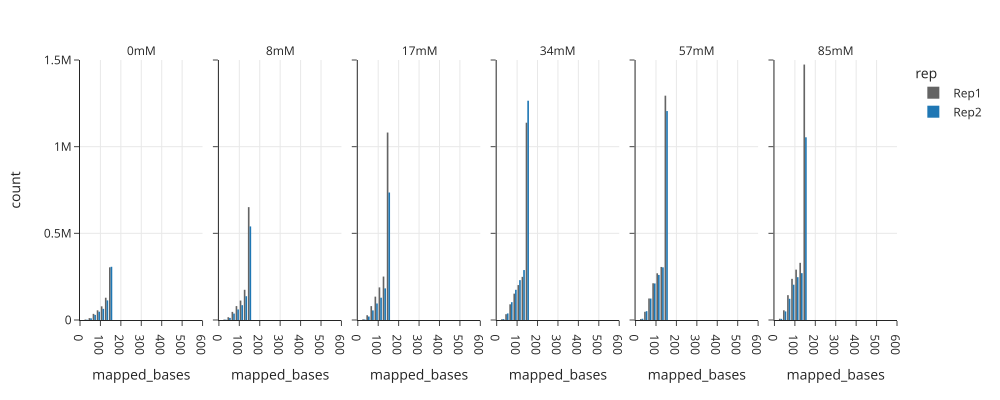

In [253]:
fig = px.histogram(illumina_df[illumina_df["mut_count"]>0],  x="mapped_bases", color="rep", facet_col="DMS_conc")
fig.update_traces(marker_line_width=0)
#fig.update_yaxes(type="log")
fig.update_layout(barmode='group')
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=160,
        size=20
    ))
fig.update_xaxes(range=[0,600], dtick=100)
fig.update_yaxes(range=[0,1500000])
fig.update_layout(width=1000, height=400)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.write_image(f"figures/illumina_comparison/mm_analysis/illumina_mapped_bases.svg")
fig.show()

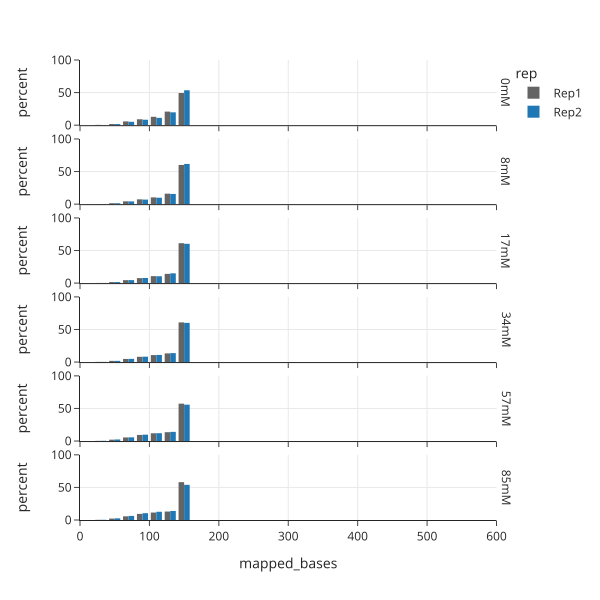

In [270]:
fig = px.histogram(illumina_df[illumina_df["mut_count"]>0],  x="mapped_bases", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_traces(marker_line_width=0)
#fig.update_yaxes(type="log")
fig.update_layout(barmode='group')
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=160,
        size=20
    ))
fig.update_xaxes(range=[0,600], dtick=100)
fig.update_yaxes(range=[0,100])
#fig.update_layout(width=1000, height=400)
fig.update_layout(width=600, height=600)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.write_image(f"figures/illumina_comparison/mm_analysis/illumina_mapped_bases_norm_percent.svg")
fig.show()

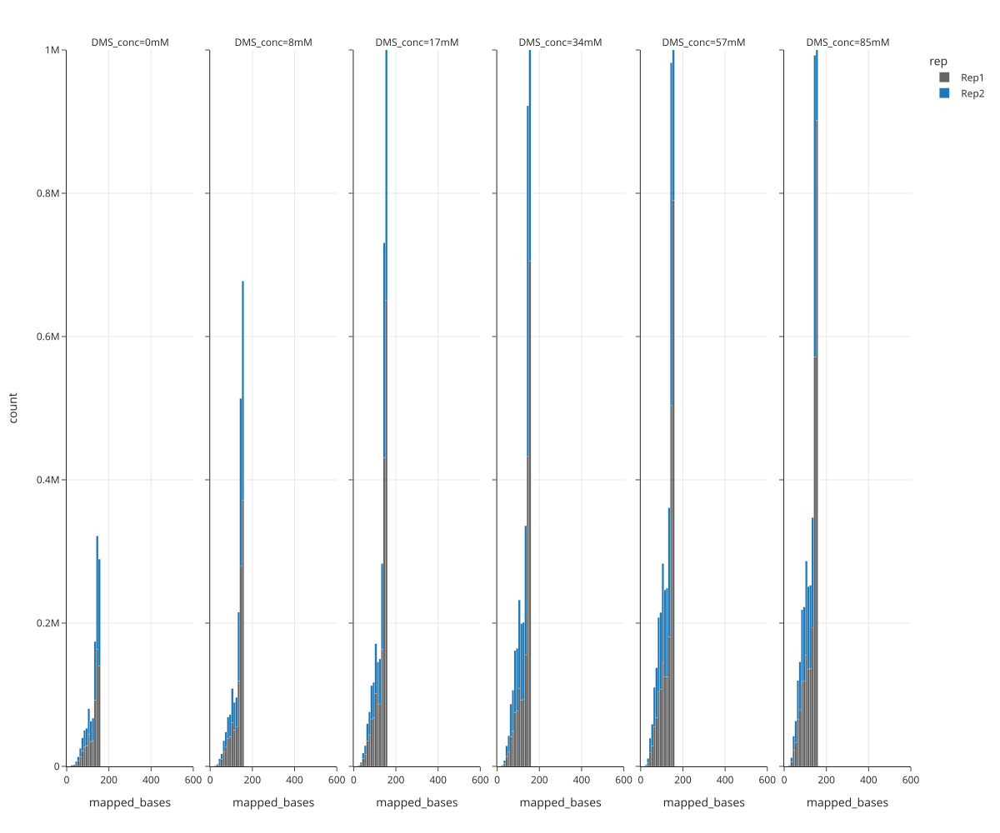

In [240]:
fig = px.histogram(illumina_df,  x="mapped_bases", color="rep", facet_col="DMS_conc")
fig.update_traces(marker_line_width=0.2)
#fig.update_yaxes(type="log")
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=200,
        size=10
    ))
fig.update_xaxes(range=[0,600])
fig.update_yaxes(range=[0,1000000])
fig.update_layout(width=1200, height=1000)
fig.show()

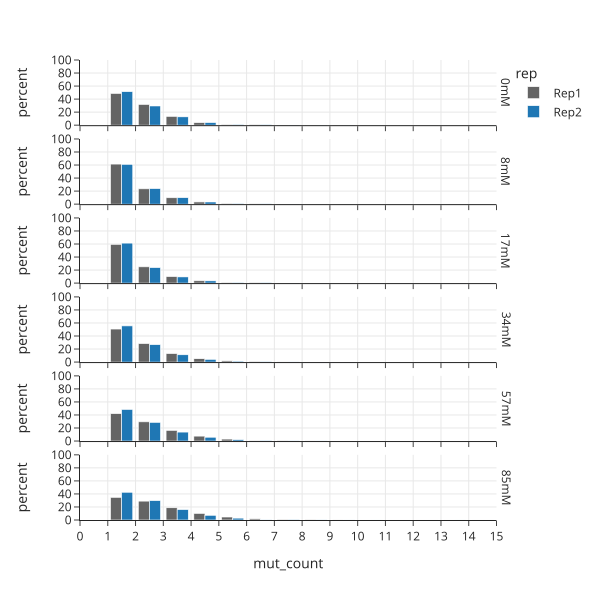

In [97]:
fig = px.histogram(illumina_df,  x="mut_count", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_layout(barmode='group')
fig.update_xaxes(range=[0,15], dtick=1)
fig.update_yaxes(range=[0,100], dtick=20)
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=20,
        size=1
    ))

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width=600, height=600)
fig.write_image(f"figures/illumina_comparison/mm_analysis/illumina_mut_count.svg")
fig.show()

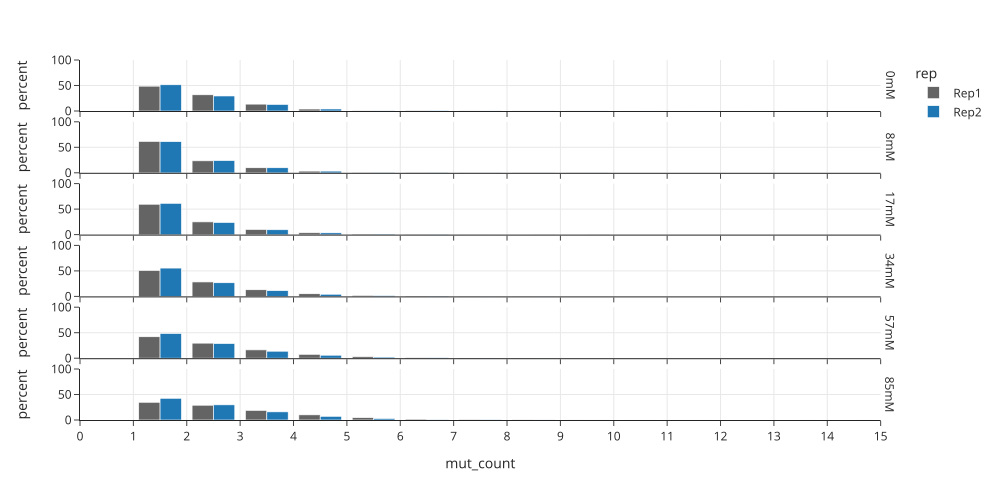

In [69]:
fig = px.histogram(illumina_df,  x="mut_count", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_layout(barmode='group')
fig.update_xaxes(range=[0,15], dtick=1)
fig.update_yaxes(range=[0,100])
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=20,
        size=1
    ))

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

In [241]:
illumina_df["percent_mut_count"] = 100*illumina_df["mut_count"] / illumina_df["mapped_bases"]

In [ ]:
fig = px.histogram(illumina_df, x="percent_mut_count", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_layout(barmode='group')
fig.update_xaxes(range=[0,3], dtick=0.1)
fig.update_yaxes(range=[0,100])
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=3,
        size=0.66
    ))
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

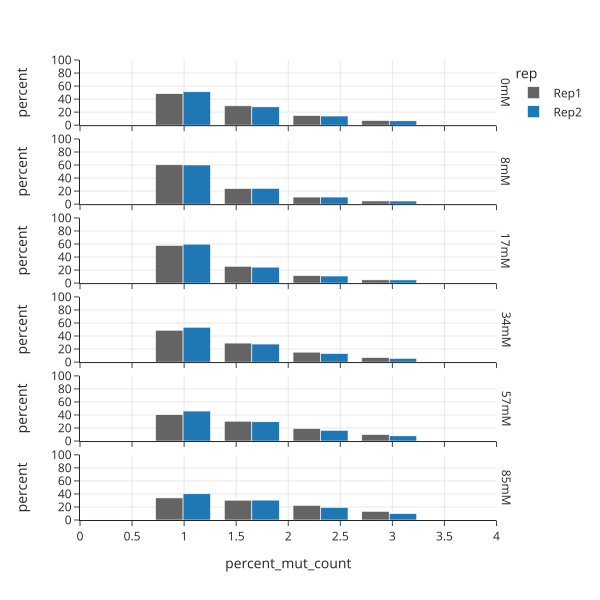

In [106]:
fig = px.histogram(illumina_df, x="percent_mut_count", histnorm="percent", color="rep", facet_row="DMS_conc")
fig.update_layout(barmode='group')
fig.update_xaxes(range=[0,4], dtick=0.5)
fig.update_yaxes(range=[0,100], dtick=20)
fig.update_traces(xbins=dict( # bins used for histogram
        start=0,
        end=3,
        size=0.66
    ))
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(width=600, height=600)
fig.write_image(f"figures/illumina_comparison/mm_analysis/illumina_mut_rate.svg")
fig.show()

In [247]:
dms_order = ["0mM", "8mM", "17mM", "34mM", "57mM", "85mM"]
nano_df['DMS_conc'] = nano_df['DMS_conc'].astype("category")
nano_df['DMS_conc'] = nano_df['DMS_conc'].cat.reorder_categories(dms_order)

In [248]:
nano_df[nano_df["mut_count"]>0].groupby("DMS_conc").agg({"mapped_bases":["mean"], "mut_count" : ["mean"], "percent_mut_count" : ["mean"]})

,mapped_bases,mut_count,percent_mut_count
,mean,mean,mean
DMS_conc,,,
0mM,442.432632,1.337281,0.328085
8mM,444.289969,1.679383,0.398544
17mM,442.854044,2.160904,0.506405
34mM,445.032913,2.936941,0.674299
57mM,443.556872,3.800077,0.868267
85mM,443.985055,4.716855,1.071325


In [242]:
dms_order = ["0mM", "8mM", "17mM", "34mM", "57mM", "85mM"]
illumina_df['DMS_conc'] = illumina_df['DMS_conc'].astype("category")
illumina_df['DMS_conc'] = illumina_df['DMS_conc'].cat.reorder_categories(dms_order)

In [245]:
illumina_df.groupby("DMS_conc").agg({"mapped_bases":["mean"], "mut_count" : ["mean"], "percent_mut_count" : ["mean"]})

,mapped_bases,mut_count,percent_mut_count
,mean,mean,mean
DMS_conc,,,
0mM,128.768619,1.813037,1.492976
8mM,132.658113,1.631791,1.294804
17mM,132.112357,1.643782,1.304696
34mM,131.412094,1.778697,1.408591
57mM,129.029935,1.980653,1.588409
85mM,128.570605,2.195249,1.753764
